/home/grios/anaconda3/lib/python3.6/site-packages/statsmodels/compat/pandas.py:56: FutureWarning: The pandas.core.datetools module is deprecated and will be removed in a future version. Please use the pandas.tseries module instead.
  from pandas.core import datetools


::

    Number of Observations - 309 (Annual 1700 - 2008)
    Number of Variables - 1
    Variable name definitions::

        SUNACTIVITY - Number of sunspots for each year

    The data file contains a 'YEAR' variable that is not returned by load.

Total: 309 | Obs: 61 (19.741100323624597%)


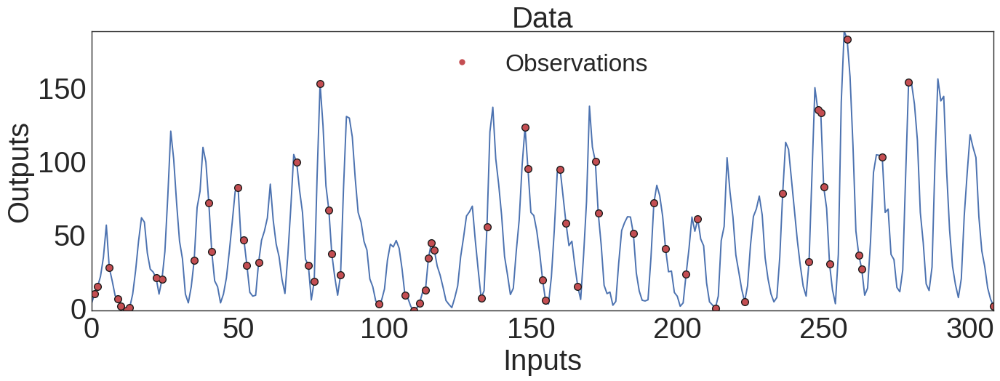

In [2]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

import numpy as np
import pandas as pd
import g3py as g3
import theano as th
import matplotlib.pyplot as plt

th.config.warn_float64 = 'warn'

g3.style_big()
g3.style_widget()

np.random.seed(123456)
x, y = g3.data_sunspots()
obs_j, x_obs, y_obs, test_j, x_test, y_test = g3.random_obs(x, y, 0.2)

# TGP Marginal (OK)

In [2]:
transport = g3.TLocation(g3.Bias(x, name='shift')) @ g3.TScale(g3.Bias(x, name='scale'))
tgp = g3.TransportGaussianProcess(space=x, transport=transport, hidden = y)
tgp.observed(x_obs, y_obs)

'Starting function value (-logp): 318.047'
'start_bfgs'
         Current function value: 317.474213
         Iterations: 4
         Function evaluations: 68
         Gradient evaluations: 56
'find_MAP'
{'TGP_scale_Bias': array(44.070457458496094, dtype=float32),
 'TGP_shift_Bias': array(48.70000076293945, dtype=float32)}


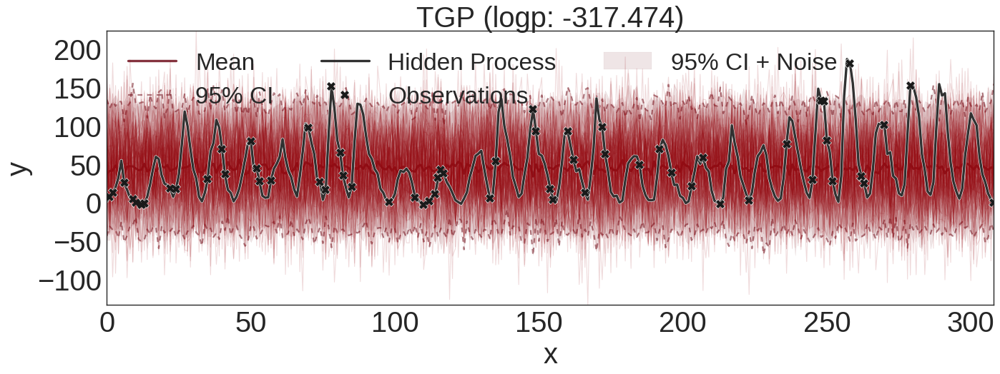

'Starting function value (-logp): 318.047'
'start_powell'
Optimization terminated successfully.
         Current function value: 317.474182
         Iterations: 2
         Function evaluations: 85
'find_MAP'
{'TGP_scale_Bias': array(44.065757751464844, dtype=float32),
 'TGP_shift_Bias': array(48.69884490966797, dtype=float32)}


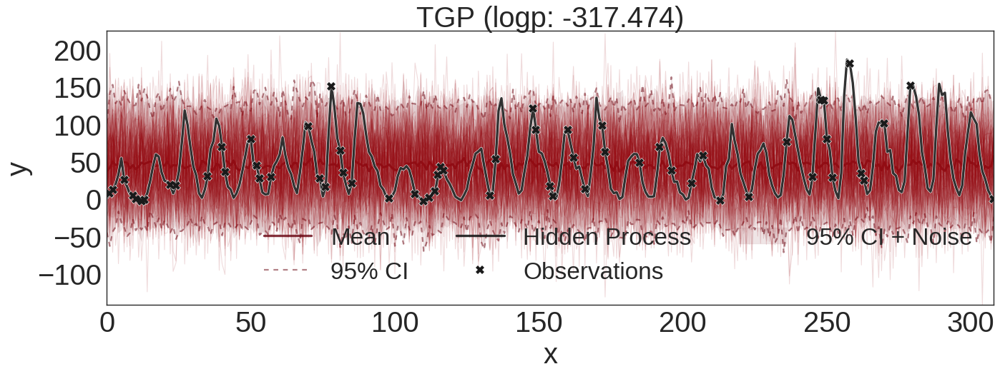

In [4]:
tp = tgp.find_MAP(points=1, init='bfgs')
tgp.plot(tp, samples=100)
g3.show()
tp = tgp.find_MAP(points=1, init='powell')
tgp.plot(tp, samples=100)

# TGP SE + KernelNoise (OK)

In [5]:
transport = g3.TLocation(g3.Bias(x)) @ g3.TKernel(g3.SE(x) + g3.KernelNoise(x))
tgp = g3.TransportGaussianProcess(space=x, transport=transport, hidden=y)
tgp.observed(x_obs, y_obs)

'Starting function value (-logp): 319.155'
'start_bfgs'
         Current function value: 313.977722
         Iterations: 13
         Function evaluations: 87
         Gradient evaluations: 75
'find_MAP'
{'TGP_Bias_Bias': array(47.96167755126953, dtype=float32),
 'TGP_KernelNoise_var_log__': array(7.282400131225586, dtype=float32),
 'TGP_SE_rate_log__': array([-3.01635528], dtype=float32),
 'TGP_SE_var_log__': array(6.169084072113037, dtype=float32)}


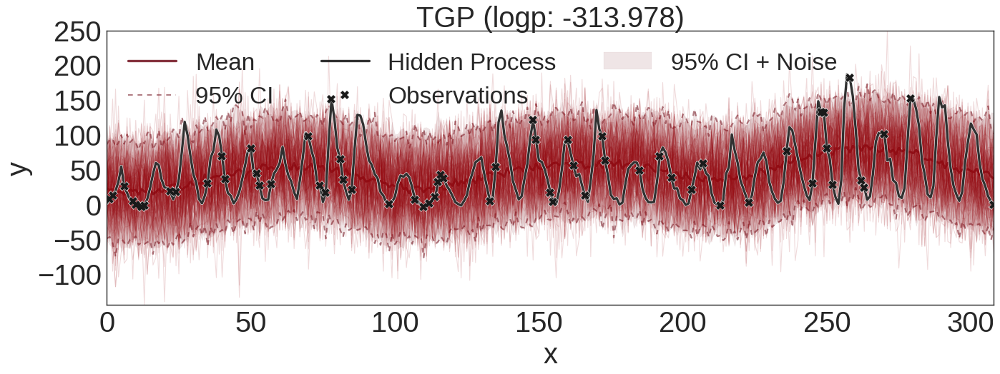

'Starting function value (-logp): 319.155'
'start_powell'
Optimization terminated successfully.
         Current function value: 304.617126
         Iterations: 9
         Function evaluations: 501
'find_MAP'
{'TGP_Bias_Bias': array(49.6024284362793, dtype=float32),
 'TGP_KernelNoise_var_log__': array(-1.7051599025726318, dtype=float32),
 'TGP_SE_rate_log__': array([-0.56437284], dtype=float32),
 'TGP_SE_var_log__': array(7.602592945098877, dtype=float32)}


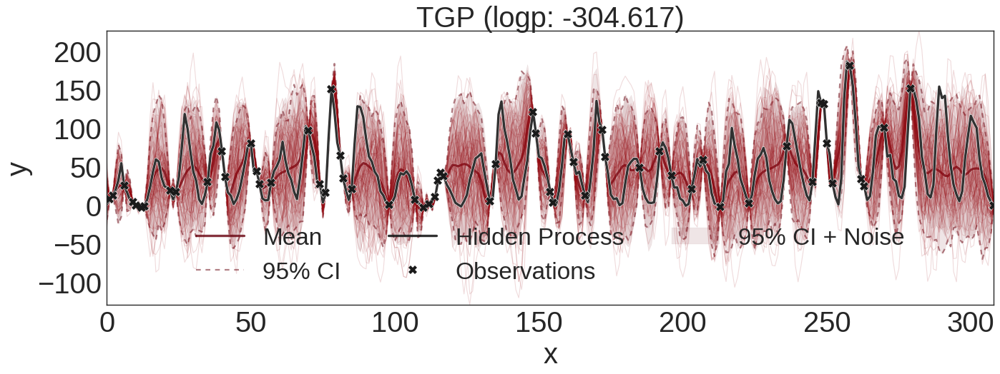

In [6]:
tp = tgp.find_MAP(points=1, init='bfgs')
tgp.plot(tp, samples=100)
g3.show()
tp = tgp.find_MAP(points=1, init='powell')
tgp.plot(tp, samples=100)

# TGP BoxCoxShifted SE + KernelNoise (OK)

In [7]:
transport = g3.TMapping(g3.BoxCoxShifted()) @ g3.TLocation(g3.Bias(x)) @ g3.TKernel(g3.SE(x) + g3.KernelNoise(x))
tgp = g3.TransportGaussianProcess(space=x, transport=transport, hidden=y, name='WGP')
tgp.observed(x_obs, y_obs)

'Starting function value (-logp): 319.155'
'start_bfgs'
         Current function value: 310.496399
         Iterations: 5
         Function evaluations: 67
         Gradient evaluations: 62
'find_MAP'
{'WGP_Bias_Bias': array(48.5776481628418, dtype=float32),
 'WGP_BoxShift_power_log__': array(-0.15294823050498962, dtype=float32),
 'WGP_BoxShift_shift': array(0.685559868812561, dtype=float32),
 'WGP_KernelNoise_var_log__': array(6.020317554473877, dtype=float32),
 'WGP_SE_rate_log__': array([-3.41818595], dtype=float32),
 'WGP_SE_var_log__': array(6.169411659240723, dtype=float32)}


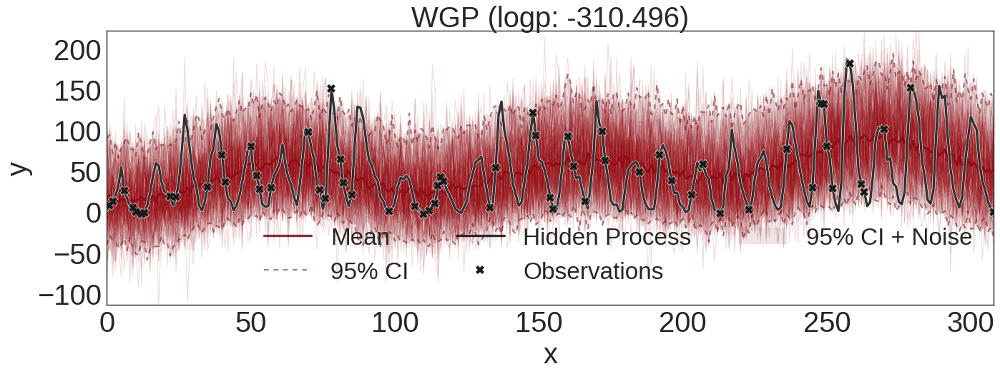

'Starting function value (-logp): 319.155'
'start_powell'
Optimization terminated successfully.
         Current function value: 297.851440
         Iterations: 8
         Function evaluations: 990
'find_MAP'
{'WGP_Bias_Bias': array(24.605348587036133, dtype=float32),
 'WGP_BoxShift_power_log__': array(-0.2250707894563675, dtype=float32),
 'WGP_BoxShift_shift': array(-2.864149455800158e-12, dtype=float32),
 'WGP_KernelNoise_var_log__': array(6.221331596374512, dtype=float32),
 'WGP_SE_rate_log__': array([-2.96513844], dtype=float32),
 'WGP_SE_var_log__': array(4.258695602416992, dtype=float32)}


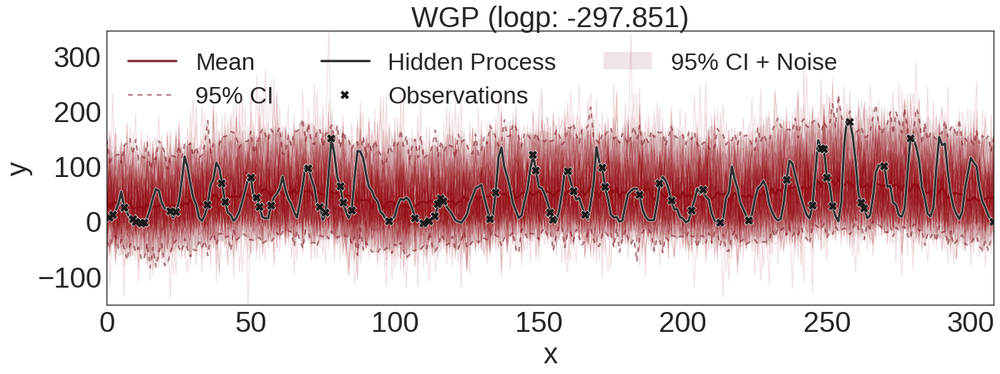

In [8]:
tp = tgp.find_MAP(points=1, init='bfgs')
tgp.plot(tp, samples=100)
g3.show()
tp = tgp.find_MAP(points=1, init='powell')
tgp.plot(tp, samples=100)

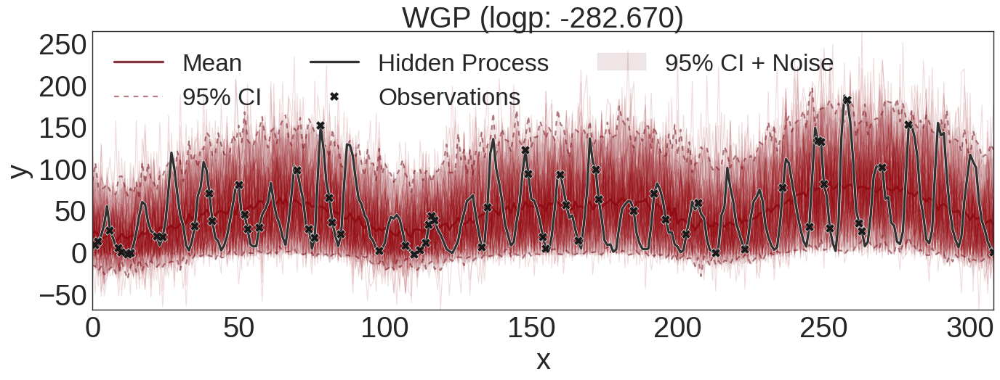

In [10]:
from numpy import float32, array
tp = {'WGP_Bias_Bias': array(16.796775817871094, dtype=float32),
 'WGP_BoxShift_power_log__': array(-0.39291009306907654, dtype=float32),
 'WGP_BoxShift_shift': array(1.4389932388031434e-12, dtype=float32),
 'WGP_KernelNoise_var_log__': array(4.639619827270508, dtype=float32),
 'WGP_SE_rate_log__': array([-2.80946803], dtype=float32),
 'WGP_SE_var_log__': array(3.7835240364074707, dtype=float32)}
tgp.plot(tp, samples=100)

'Starting function value (-logp): 319.155'
'start_bfgs'
         Current function value: 310.496399
         Iterations: 5
         Function evaluations: 67
         Gradient evaluations: 62
'start_powell'
Optimization terminated successfully.
         Current function value: 297.851440
         Iterations: 8
         Function evaluations: 990
'start_bfgs_powell'
Optimization terminated successfully.
         Current function value: 288.464508
         Iterations: 9
         Function evaluations: 884
'start_powell_bfgs'
         Current function value: 297.851440
         Iterations: 0
         Function evaluations: 76
         Gradient evaluations: 64
'find_MAP'
{'WGP_Bias_Bias': array(8.5801420211792, dtype=float32),
 'WGP_BoxShift_power_log__': array(-0.7794831395149231, dtype=float32),
 'WGP_BoxShift_shift': array(-1.9999998807907104, dtype=float32),
 'WGP_KernelNoise_var_log__': array(3.161289930343628, dtype=float32),
 'WGP_SE_rate_log__': array([-2.58030224], dtype=float32),
 'W

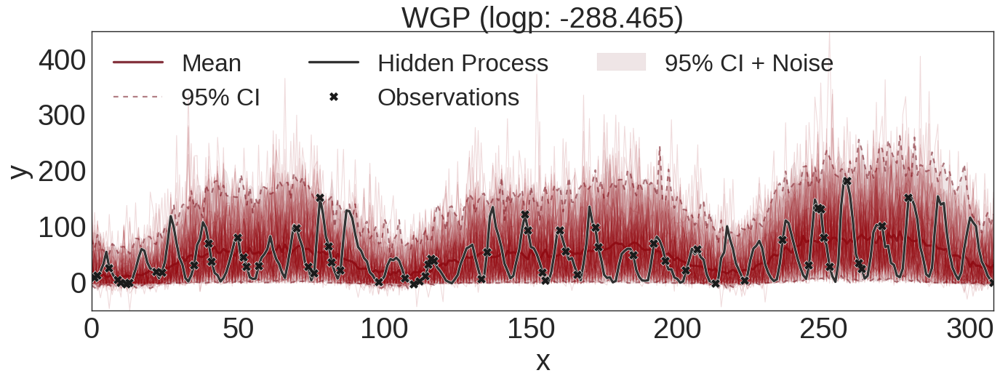

In [11]:
tp = tgp.find_MAP(points=4)
tgp.plot(tp, samples=100)

# Noisy TGP Zero SE (OK)

In [22]:
transport = g3.TKernel(g3.SE(x), noisy=True)
tgp = g3.TransportGaussianProcess(space=x, transport=transport, hidden=y)
tgp.observed(x_obs, y_obs)

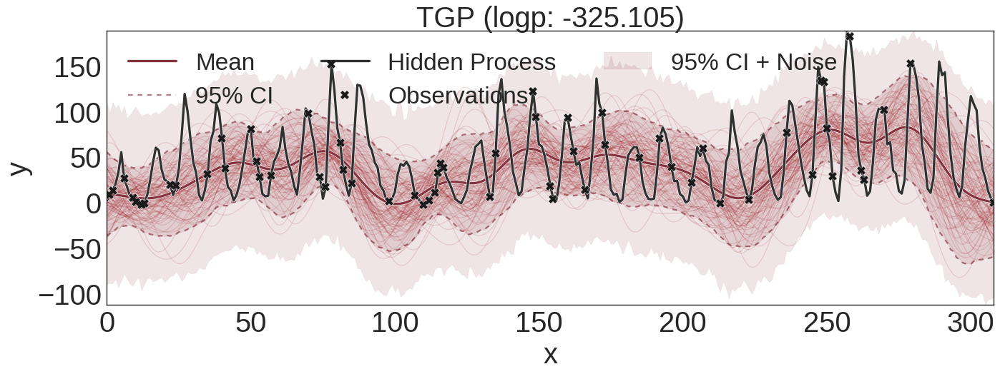

In [23]:
tgp.plot(samples=100, simulations=300)

'Starting function value (-logp): 325.105'
'start_bfgs'
         Current function value: 317.266785
         Iterations: 10
         Function evaluations: 80
         Gradient evaluations: 68
'find_MAP'
{'TGP_NoiseSE_var_log__': array(7.452335357666016, dtype=float32),
 'TGP_SE_rate_log__': array([-5.90839386], dtype=float32),
 'TGP_SE_var_log__': array(8.128828048706055, dtype=float32)}


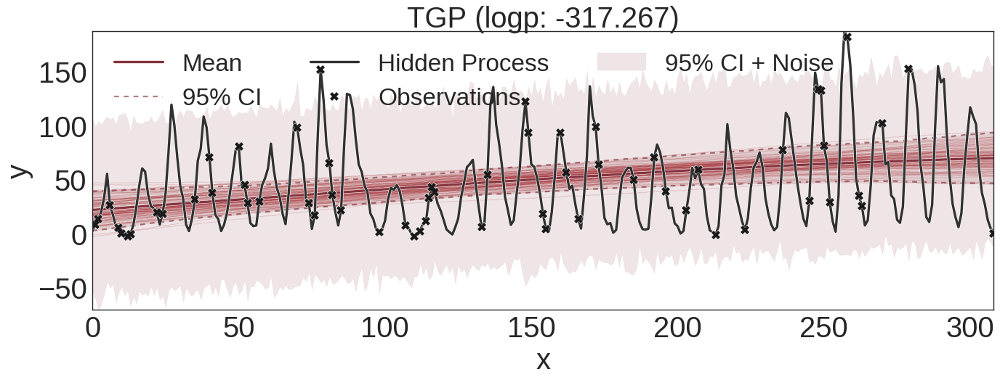

'Starting function value (-logp): 325.105'
'start_powell'
Optimization terminated successfully.
         Current function value: 317.364868
         Iterations: 2
         Function evaluations: 90
'find_MAP'
{'TGP_NoiseSE_var_log__': array(7.26577091217041, dtype=float32),
 'TGP_SE_rate_log__': array([-3.63036084], dtype=float32),
 'TGP_SE_var_log__': array(7.805665493011475, dtype=float32)}


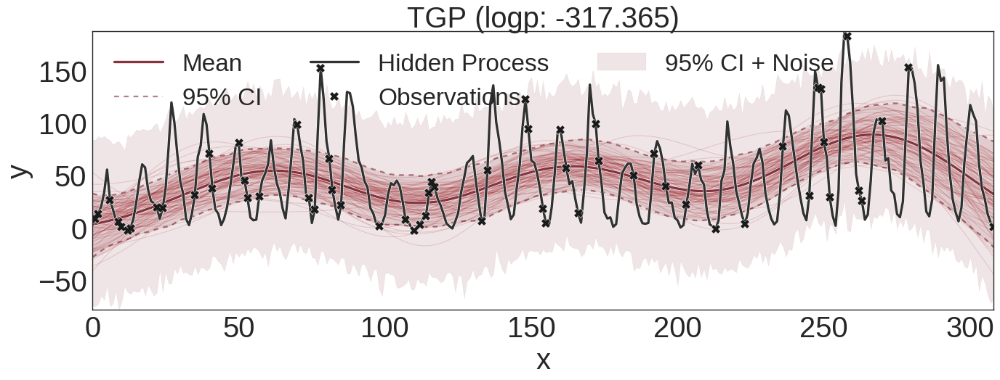

In [24]:
tp = tgp.find_MAP(points=1, init='bfgs')
tgp.plot(tp, samples=100, simulations=300)
g3.show()
tp = tgp.find_MAP(points=1, init='powell')
tgp.plot(tp, samples=100, simulations=300)

# Noisy TGP Bias SE (OK)

In [25]:
transport = g3.TLocation(g3.Bias(x)) @ g3.TKernel(g3.SE(x), noisy=True)
tgp = g3.TransportGaussianProcess(space=x, transport=transport, hidden=y)
tgp.observed(x_obs, y_obs)

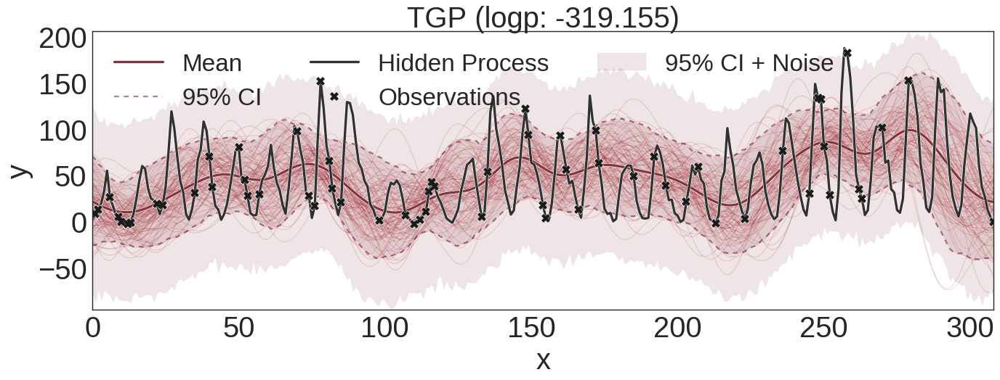

In [26]:
tgp.plot(samples=100, simulations=1000)

'Starting function value (-logp): 319.155'
'start_bfgs'
         Current function value: 313.977722
         Iterations: 13
         Function evaluations: 87
         Gradient evaluations: 75
'find_MAP'
{'TGP_Bias_Bias': array(47.96167755126953, dtype=float32),
 'TGP_NoiseSE_var_log__': array(7.282400131225586, dtype=float32),
 'TGP_SE_rate_log__': array([-3.01635528], dtype=float32),
 'TGP_SE_var_log__': array(6.169084072113037, dtype=float32)}


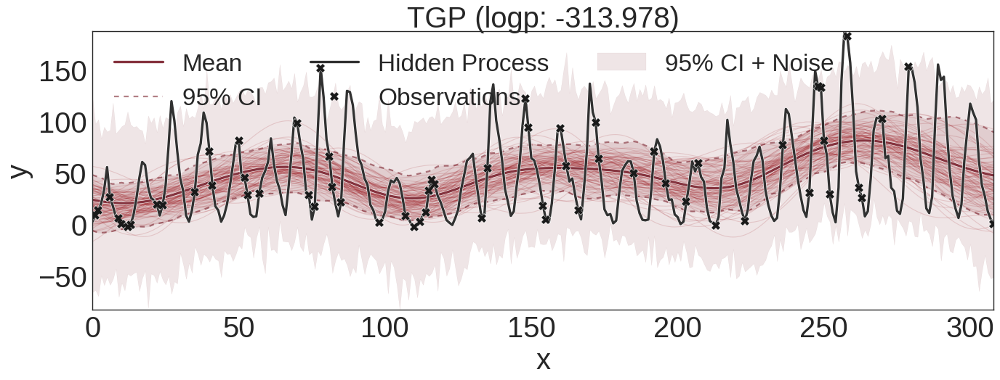

'Starting function value (-logp): 319.155'
'start_powell'
Optimization terminated successfully.
         Current function value: 304.617126
         Iterations: 9
         Function evaluations: 501
'find_MAP'
{'TGP_Bias_Bias': array(49.6024284362793, dtype=float32),
 'TGP_NoiseSE_var_log__': array(-1.7051599025726318, dtype=float32),
 'TGP_SE_rate_log__': array([-0.56437284], dtype=float32),
 'TGP_SE_var_log__': array(7.602592945098877, dtype=float32)}


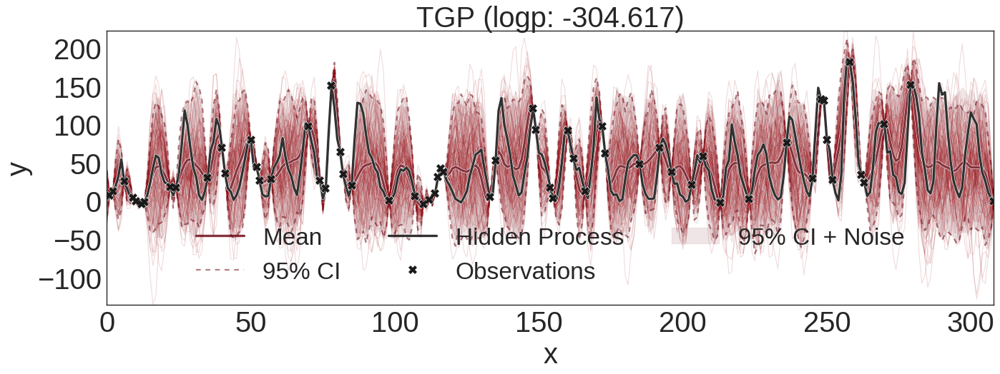

In [27]:
tp = tgp.find_MAP(points=1, init='bfgs')
tgp.plot(tp, samples=100)
g3.show()
tp = tgp.find_MAP(points=1, init='powell')
tgp.plot(tp, samples=100)

# Noisy TGP BoxCoxShifted Bias SE (OK)

In [8]:
transport = g3.TMapping(g3.BoxCoxShifted()) @ g3.TLocation(g3.Bias(x)) @ g3.TKernel(g3.SE(x), noisy=True)
tgp = g3.TransportGaussianProcess(space=x, transport=transport, hidden=y)
tgp.observed(x_obs, y_obs)

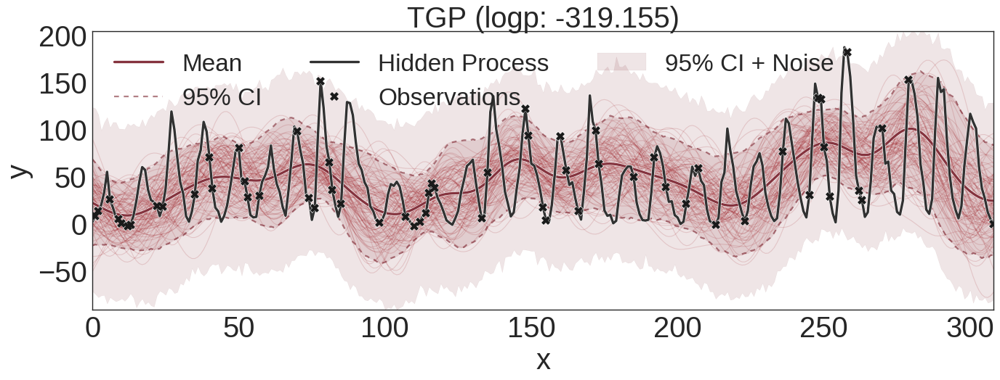

In [9]:
tgp.plot(samples=100, simulations=1000)

'Starting function value (-logp): 319.155'
'start_bfgs'
         Current function value: 310.496399
         Iterations: 5
         Function evaluations: 67
         Gradient evaluations: 62
'find_MAP'
{'TGP_Bias_Bias': array(48.5776481628418, dtype=float32),
 'TGP_BoxShift_power_log__': array(-0.15294823050498962, dtype=float32),
 'TGP_BoxShift_shift': array(0.685559868812561, dtype=float32),
 'TGP_NoiseSE_var_log__': array(6.020317554473877, dtype=float32),
 'TGP_SE_rate_log__': array([-3.41818595], dtype=float32),
 'TGP_SE_var_log__': array(6.169411659240723, dtype=float32)}


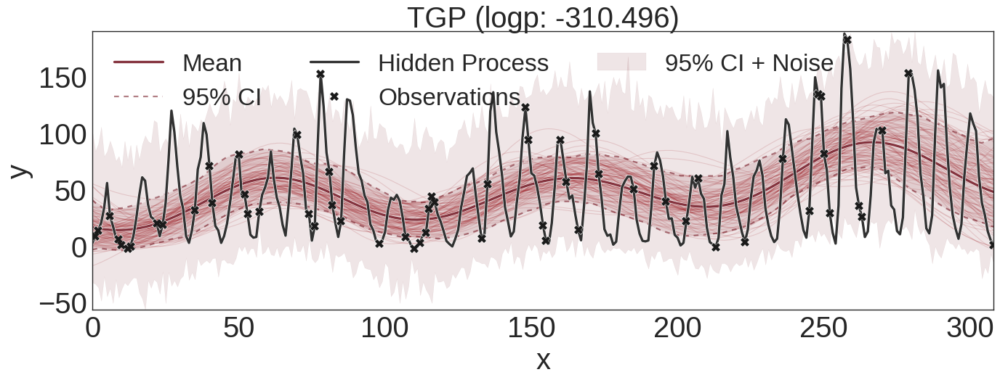

'Starting function value (-logp): 319.155'
'start_powell'
Optimization terminated successfully.
         Current function value: 297.851440
         Iterations: 8
         Function evaluations: 990
'find_MAP'
{'TGP_Bias_Bias': array(24.605348587036133, dtype=float32),
 'TGP_BoxShift_power_log__': array(-0.2250707894563675, dtype=float32),
 'TGP_BoxShift_shift': array(-2.864149455800158e-12, dtype=float32),
 'TGP_NoiseSE_var_log__': array(6.221331596374512, dtype=float32),
 'TGP_SE_rate_log__': array([-2.96513844], dtype=float32),
 'TGP_SE_var_log__': array(4.258695602416992, dtype=float32)}


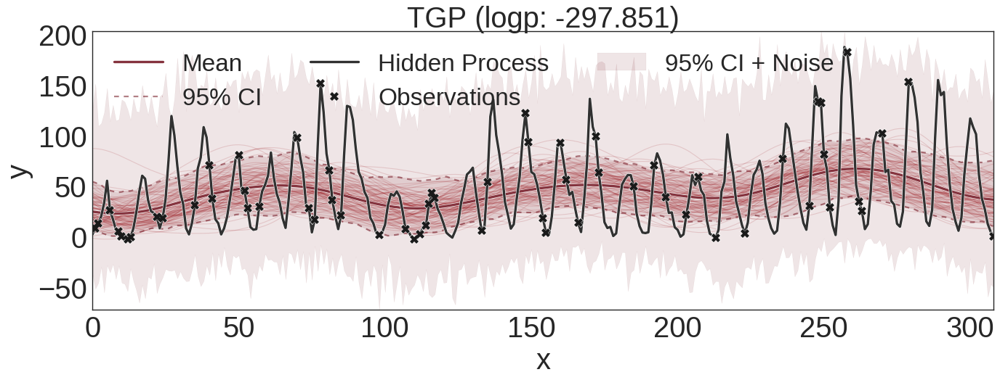

In [10]:
tp = tgp.find_MAP(points=1, init='bfgs')
tgp.plot(tp, samples=100)
g3.show()
tp = tgp.find_MAP(points=1, init='powell')
tgp.plot(tp, samples=100)

In [11]:
tp = {'TGP_Bias_Bias': array(16.796775817871094, dtype=float32),
 'TGP_BoxShift_power_log__': array(-0.39291009306907654, dtype=float32),
 'TGP_BoxShift_shift': array(1.4389932388031434e-12, dtype=float32),
 'TGP_NoiseSE_var_log__': array(4.639619827270508, dtype=float32),
 'TGP_SE_rate_log__': array([-2.80946803], dtype=float32),
 'TGP_SE_var_log__': array(3.7835240364074707, dtype=float32)}

tgp.plot(tp, samples=100)

NameError: name 'array' is not defined

## Full TGP

In [3]:
transport = g3.TMapping(g3.BoxCoxShifted(name='BC2')) @ g3.TLocation(g3.Bias(x)) @ g3.TKernel(g3.SE(x, name='SE2'), noisy=True) @ g3.TMapping(g3.LogShifted())# @ g3.TKernel(g3.SE(x), noisy=True)
tgp = g3.TransportGaussianProcess(space=x, transport=transport, hidden=y, name='WGP')
tgp.observed(x_obs, y_obs)

In [4]:
tgp.widget()

interactive(children=(FloatSlider(value=1.0, description='WGP_BC2_shift', max=2.0, step=0.01), FloatSlider(value=0.0, description='WGP_BC2_power_log__', max=5.0, min=-5.0, step=0.01), FloatSlider(value=48.70000076293945, description='WGP_Bias_Bias', max=97.4000015258789, step=0.01), FloatSlider(value=7.571113586425781, description='WGP_SE2_var_log__', max=15.142227172851562, step=0.01), FloatSlider(value=-2.325650453567505, description='WGP_SE2_rate_log__', max=0.0, min=-4.65130090713501, step=0.01), FloatSlider(value=7.571113586425781, description='WGP_NoiseSE2_var_log__', max=15.142227172851562, step=0.01), FloatSlider(value=-1.0, description='WGP_LogShifted_shift', max=0.0, min=-2.0, step=0.01), Button(description='Run Interact', style=ButtonStyle()), Output()), _dom_classes=('widget-interact',))

'Starting function value (-logp): 1e+30'
'start_bfgs'
Optimization terminated successfully.
         Current function value: 1000000015047466219876688855040.000000
         Iterations: 0
         Function evaluations: 1
         Gradient evaluations: 1
'find_MAP'
{'WGP_BC2_power_log__': array(0.0, dtype=float32),
 'WGP_BC2_shift': 1.0,
 'WGP_Bias_Bias': 48.700001,
 'WGP_LogShifted_shift': -1.0,
 'WGP_NoiseSE2_var_log__': array(7.571113586425781, dtype=float32),
 'WGP_SE2_rate_log__': array([-2.32565045], dtype=float32),
 'WGP_SE2_var_log__': array(7.571113586425781, dtype=float32)}


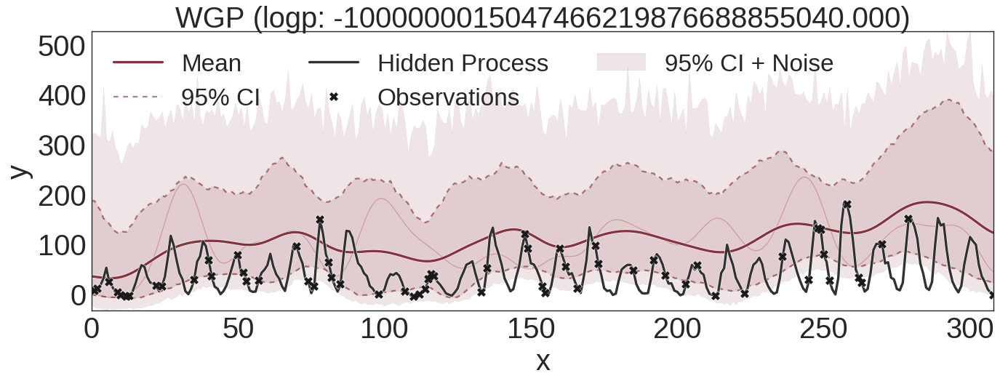

In [5]:
tp = tgp.find_MAP(start=tgp.params_widget, points=1, init='bfgs')
tgp.plot(tp, samples=1, simulations=1000)

In [6]:
tgp.widget(tp)

interactive(children=(FloatSlider(value=1.0, description='WGP_BC2_shift', max=2.0, step=0.01), FloatSlider(value=0.0, description='WGP_BC2_power_log__', max=5.0, min=-5.0, step=0.01), FloatSlider(value=48.70000076293945, description='WGP_Bias_Bias', max=97.4000015258789, step=0.01), FloatSlider(value=7.571113586425781, description='WGP_SE2_var_log__', max=15.142227172851562, step=0.01), FloatSlider(value=-2.325650453567505, description='WGP_SE2_rate_log__', max=0.0, min=-4.65130090713501, step=0.01), FloatSlider(value=7.571113586425781, description='WGP_NoiseSE2_var_log__', max=15.142227172851562, step=0.01), FloatSlider(value=-1.0, description='WGP_LogShifted_shift', max=0.0, min=-2.0, step=0.01), Button(description='Run Interact', style=ButtonStyle()), Output()), _dom_classes=('widget-interact',))

'Starting function value (-logp): 1e+30'
'start_powell'
Optimization terminated successfully.
         Current function value: 1000000015047466219876688855040.000000
         Iterations: 1
         Function evaluations: 85
'find_MAP'
{'WGP_BC2_power_log__': array(0.0, dtype=float32),
 'WGP_BC2_shift': 1.0,
 'WGP_Bias_Bias': 48.700001,
 'WGP_LogShifted_shift': -1.0,
 'WGP_NoiseSE2_var_log__': array(7.571113586425781, dtype=float32),
 'WGP_SE2_rate_log__': array([-2.32565045], dtype=float32),
 'WGP_SE2_var_log__': array(7.571113586425781, dtype=float32)}


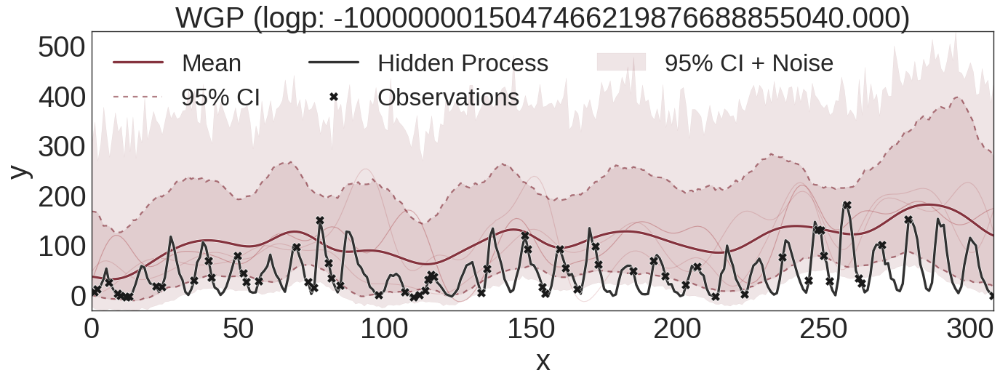

In [7]:
tp = tgp.find_MAP(start=tgp.params_widget, points=1, init='powell')
tgp.plot(tp, samples=3, simulations=1000)

AttributeError('No such attribute: array_posterior_dlogp',)
'Starting function value (-logp): 128405.0'
'start_bfgs'
Optimization terminated successfully.
         Current function value: 128405.453125
         Iterations: 0
         Function evaluations: 9
         Gradient evaluations: 1
'start_powell'
Optimization terminated successfully.
         Current function value: 155.674927
         Iterations: 4
         Function evaluations: 772
'find_MAP'
{'WGP_BoxShift_power_log_': array(-0.8606927394866943, dtype=float32),
 'WGP_BoxShift_shift': array(0.8805791139602661, dtype=float32),
 'WGP_KernelNoise_var_log_': array(2.970625877380371, dtype=float32),
 'WGP_SE2_rate_log_': array([-2.37290692], dtype=float32),
 'WGP_SE2_var_log_': array(2.8490917682647705, dtype=float32),
 'WGP_SE_rate_log_': array([-0.63396645], dtype=float32),
 'WGP_SE_var_log_': array(-0.32276469469070435, dtype=float32)}


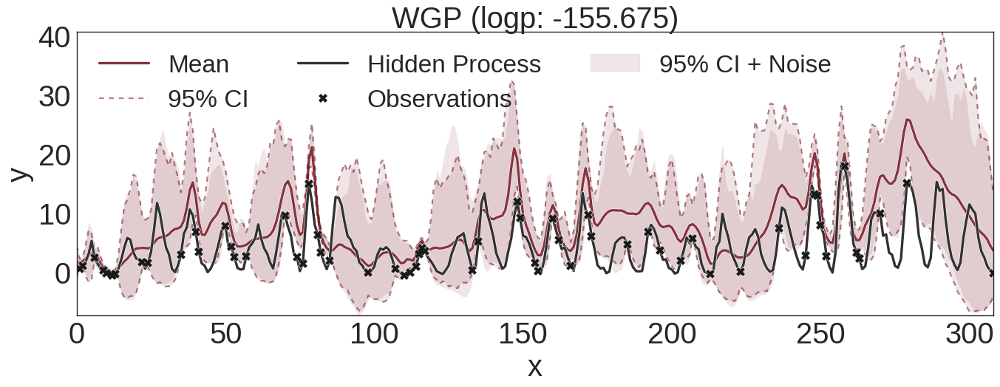

In [90]:
tgp.plot(tgp.find_MAP(start=tgp.params, points=2))

In [91]:
tgp.params

{'WGP_BoxShift_power_log_': array(0.0, dtype=float32),
 'WGP_BoxShift_shift': 1.0,
 'WGP_KernelNoise_var_log_': array(2.9659433364868164, dtype=float32),
 'WGP_SE2_rate_log_': array([-2.32565045], dtype=float32),
 'WGP_SE2_var_log_': array(2.9659433364868164, dtype=float32),
 'WGP_SE_rate_log_': array([-2.32565045], dtype=float32),
 'WGP_SE_var_log_': array(2.9659433364868164, dtype=float32)}

AttributeError('No such attribute: array_posterior_dlogp',)
'Starting function value (-logp): 128405.0'
'start_bfgs'
Optimization terminated successfully.
         Current function value: 128405.453125
         Iterations: 0
         Function evaluations: 9
         Gradient evaluations: 1
'start_powell'
Optimization terminated successfully.
         Current function value: 155.674927
         Iterations: 4
         Function evaluations: 772
'find_MAP'
{'WGP_BoxShift_power_log_': array(-0.8606927394866943, dtype=float32),
 'WGP_BoxShift_shift': array(0.8805791139602661, dtype=float32),
 'WGP_KernelNoise_var_log_': array(2.970625877380371, dtype=float32),
 'WGP_SE2_rate_log_': array([-2.37290692], dtype=float32),
 'WGP_SE2_var_log_': array(2.8490917682647705, dtype=float32),
 'WGP_SE_rate_log_': array([-0.63396645], dtype=float32),
 'WGP_SE_var_log_': array(-0.32276469469070435, dtype=float32)}


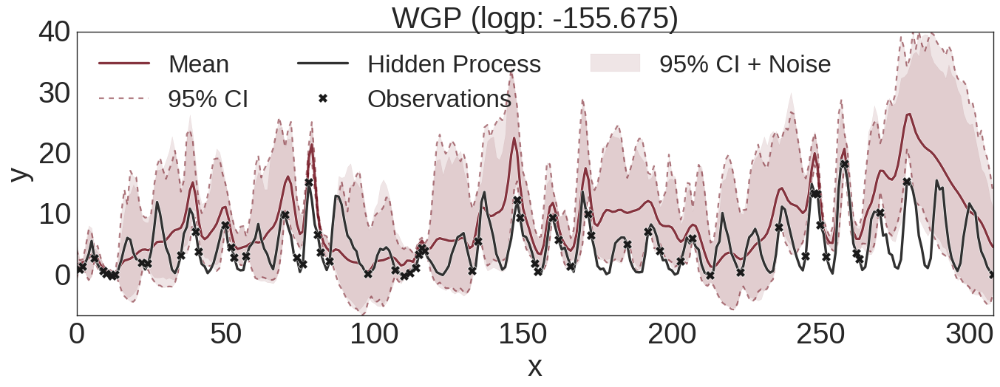

In [92]:
tgp.plot(tgp.find_MAP(start=tgp.params, points=2))

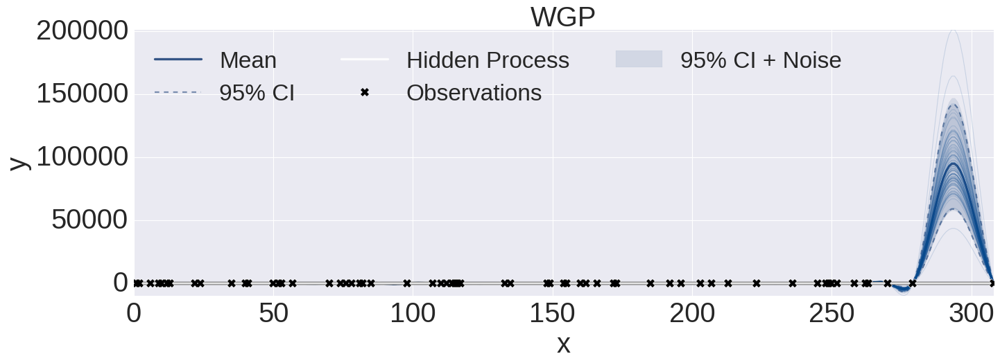

In [89]:
tgp.plot(tgp.params_widget, samples=100, logp=False, mean=True, quantiles=True,
         quantiles_noise=True, prior=False, data=False)

In [79]:
tgp.widget(tp2, samples=100, logp=False, mean=False, quantiles=False, quantiles_noise=False, prior=True, data=False)

/opt/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


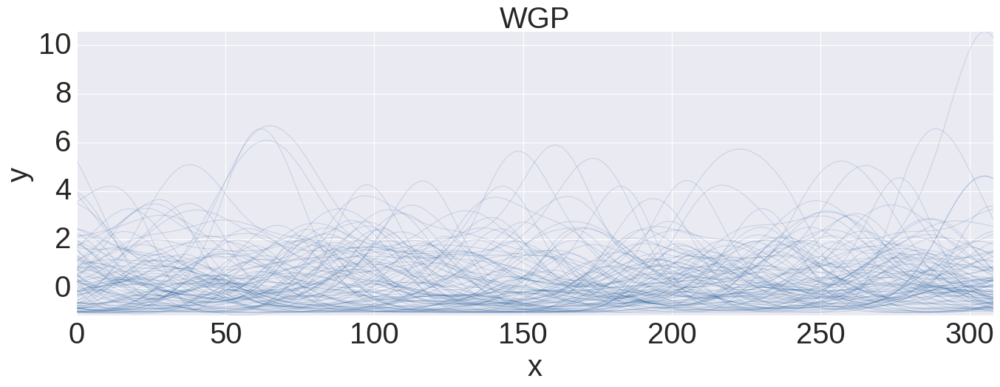

In [82]:
tgp.plot(tgp.params_widget, samples=100, logp=False, mean=False, quantiles=False, quantiles_noise=False, prior=True, data=False)

AttributeError('No such attribute: array_posterior_dlogp',)
'Starting function value (-logp): 536.648'
'start_powell'
Optimization terminated successfully.
         Current function value: 245.560059
         Iterations: 21
         Function evaluations: 2639
'find_MAP'
{'WGP_Bias_Bias': array(10.97989273071289, dtype=float32),
 'WGP_BoxShift_power_log_': array(-1.1446479558944702, dtype=float32),
 'WGP_BoxShift_shift': array(4.492410675231706e-14, dtype=float32),
 'WGP_KernelNoise_var_log_': array(-1.406898021697998, dtype=float32),
 'WGP_SE2_var_log_': array(-2.442382574081421, dtype=float32),
 'WGP_SE_rate_log_': array([-0.51223862], dtype=float32),
 'WGP_SE_var_log_': array(3.2962753772735596, dtype=float32)}


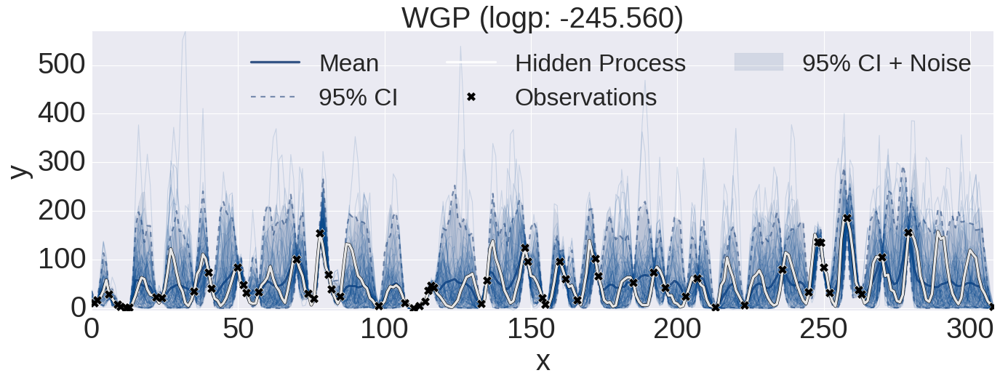

In [60]:
tp = tgp.find_MAP(points=1, init='powell')
tgp.plot(tp, samples=100, simulations=100)

In [ ]:
tp = tgp.find_MAP(points=1, init='bfgs')
tgp.plot(tp)
g3.show()

'Starting function value (-logp): 318.782'
'start_powell'
Optimization terminated successfully.
         Current function value: 308.686188
         Iterations: 7
         Function evaluations: 419
'find_MAP'
{'TGP_Bias_Bias': array(43.320091247558594, dtype=float32),
 'TGP_NoiseSE_var_log_': array(3.111161470413208, dtype=float32),
 'TGP_SE_rate_log_': array([-0.30218607], dtype=float32),
 'TGP_SE_var_log_': array(7.540206432342529, dtype=float32)}


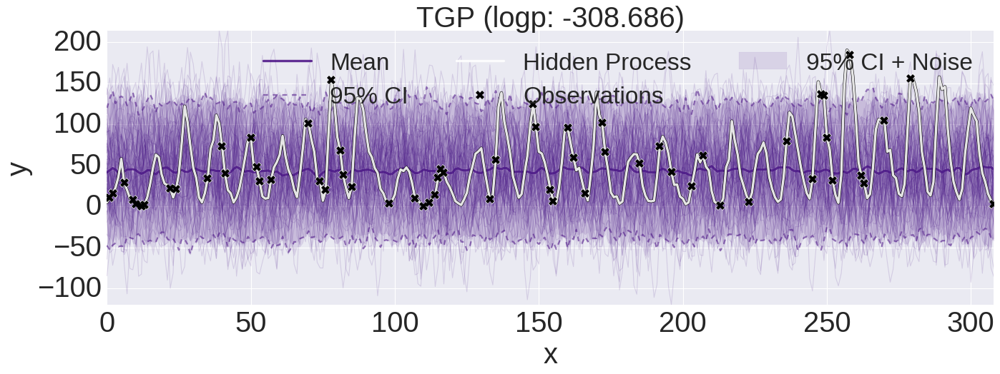

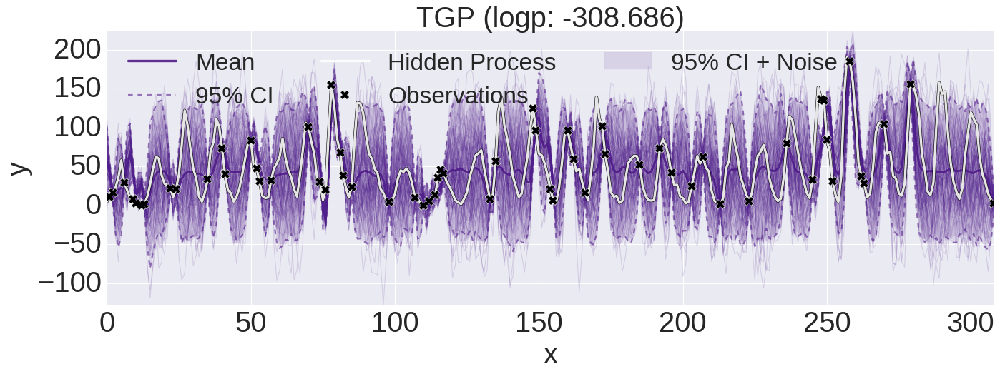

In [9]:


tgp.plot(tp, quantiles=True, quantiles_noise=True, median=False, mean=True, samples=100,
         prior=True, palette='Purples', logp=True, simulations=300)
g3.show()
tgp.plot(tp, quantiles=True, quantiles_noise=True, median=False, mean=True, samples=100,
         prior=False, palette='Purples', logp=True, simulations=300)

In [ ]:
AQUI

'Starting function value (-logp): 318.782'
'start_bfgs'
         Current function value: 313.910706
         Iterations: 14
         Function evaluations: 100
         Gradient evaluations: 88
'find_MAP'
{'TGP_Bias_Bias': array(47.489017486572266, dtype=float32),
 'TGP_NoiseSE_var_log_': array(7.272408962249756, dtype=float32),
 'TGP_SE_rate_log_': array([-2.81697631], dtype=float32),
 'TGP_SE_var_log_': array(6.129624843597412, dtype=float32)}


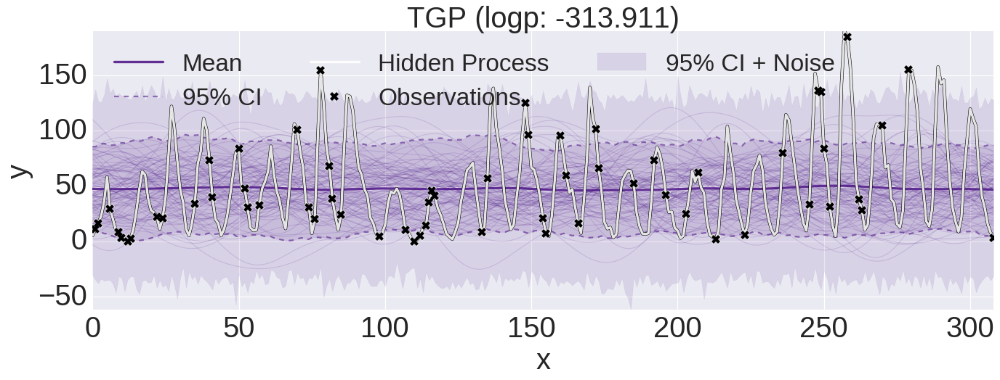

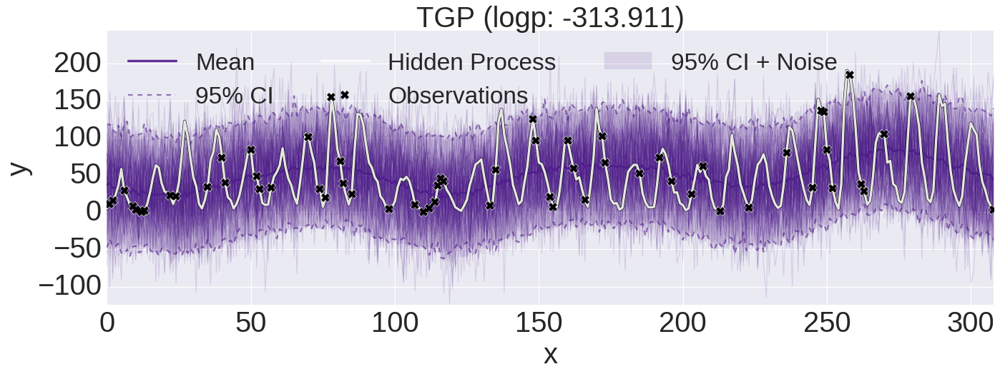

'Starting function value (-logp): 318.782'
'start_powell'
Optimization terminated successfully.
         Current function value: 308.686188
         Iterations: 7
         Function evaluations: 419
'find_MAP'
{'TGP_Bias_Bias': array(43.320091247558594, dtype=float32),
 'TGP_NoiseSE_var_log_': array(3.111161470413208, dtype=float32),
 'TGP_SE_rate_log_': array([-0.30218607], dtype=float32),
 'TGP_SE_var_log_': array(7.540206432342529, dtype=float32)}


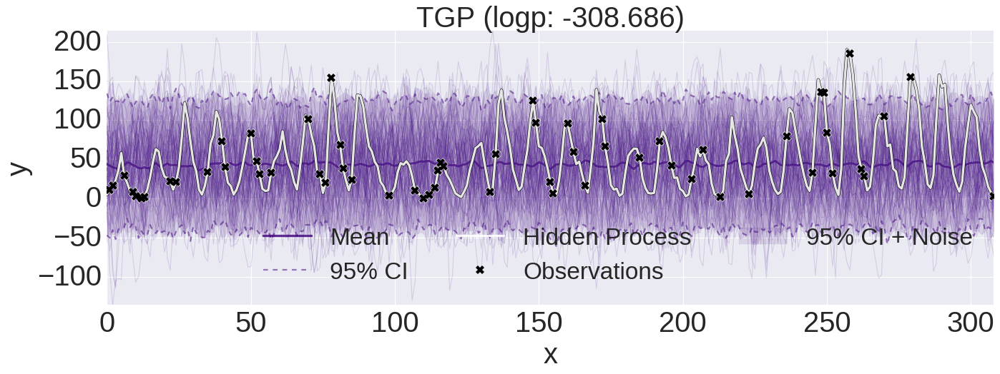

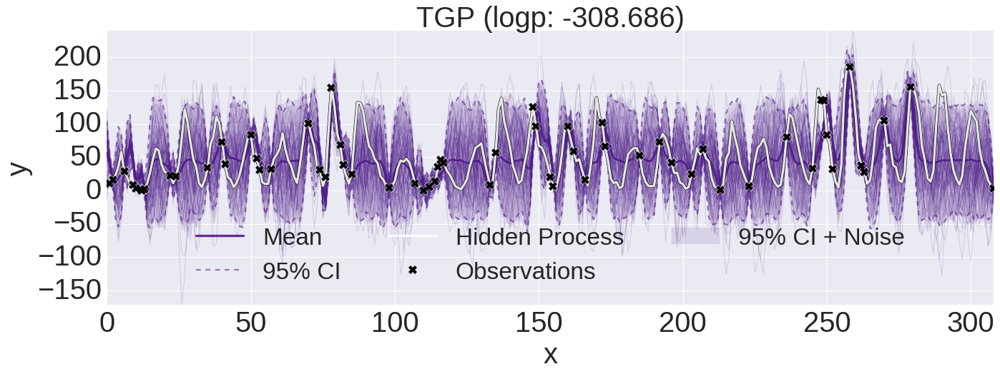

In [14]:
transport = g3.TLocation(g3.Bias(x)) @ g3.TKernel(g3.SE(x), noisy=True)
tgp = g3.TransportGaussianProcess(space=x, transport=transport, hidden=y)
tgp.observed(x_obs, y_obs)
tp = tgp.find_MAP(points=1, init='powell')

tgp.plot(tp, quantiles=True, quantiles_noise=True, median=False, mean=True, samples=100,
         prior=True, palette='Purples', logp=True, simulations=300)
g3.show()
tgp.plot(tp, quantiles=True, quantiles_noise=True, median=False, mean=True, samples=100,
         prior=False, palette='Purples', logp=True, simulations=300)

'Starting function value (-logp): 318.782'
'start_bfgs'
         Current function value: 313.910706
         Iterations: 14
         Function evaluations: 100
         Gradient evaluations: 88
'find_MAP'
{'TGP_Bias_Bias': array(47.489017486572266, dtype=float32),
 'TGP_Noise_var_log_': array(7.272408962249756, dtype=float32),
 'TGP_SE_rate_log_': array([-2.81697631], dtype=float32),
 'TGP_SE_var_log_': array(6.129624843597412, dtype=float32)}


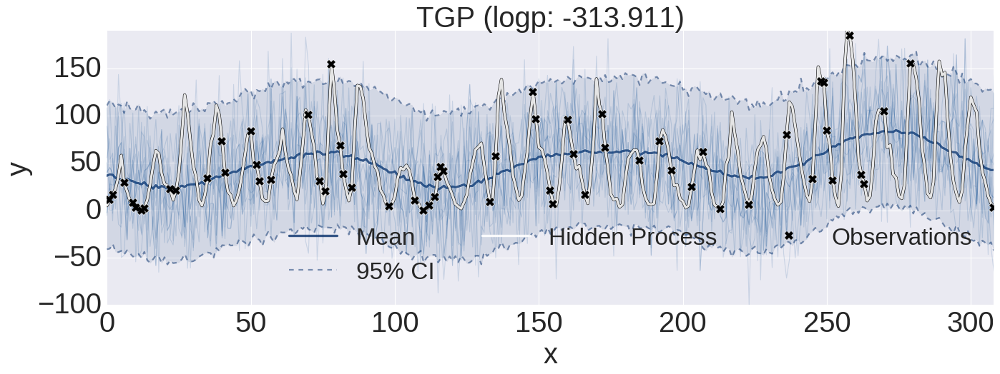

In [28]:
tgp.observed(x_obs, y_obs)
tp = tgp.find_MAP(points=1, init='bfgs')
tgp.plot(tp, quantiles_noise=False, median=False, mean=True, samples=10, logp=True)

# TGP equivalente a WGP

'Starting function value (-logp): 318.782'
'start_bfgs'
         Current function value: 299.524902
         Iterations: 11
         Function evaluations: 53
         Gradient evaluations: 43
'find_MAP'
{'TGP_Bias_Bias': array(13.469615936279297, dtype=float32),
 'TGP_BoxShift_power_log_': array(-0.49241992831230164, dtype=float32),
 'TGP_BoxShift_shift': array(-1.4443211555480957, dtype=float32),
 'TGP_NoiseSE_var_log_': array(4.347862720489502, dtype=float32),
 'TGP_SE_rate_log_': array([-3.56278539], dtype=float32),
 'TGP_SE_var_log_': array(3.862224817276001, dtype=float32)}


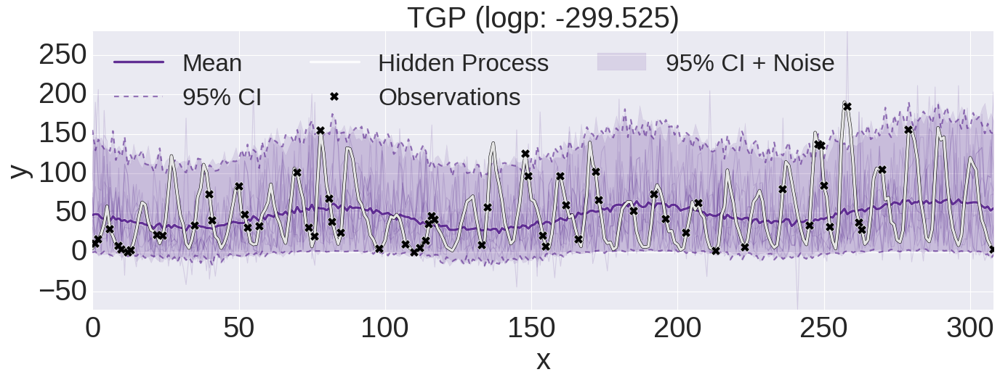

In [21]:

tp = tgp.find_MAP(points=1, init='bfgs')
tgp.plot(tp, quantiles_noise=True, median=False, mean=True, samples=10, prior=False, 
         palette='Purples', logp=True, simulations=300, noise=True)

'Starting function value (-logp): 318.782'
'start_powell'
Optimization terminated successfully.
         Current function value: 298.189453
         Iterations: 8
         Function evaluations: 1058
'find_MAP'
{'TGP_Bias_Bias': array(26.38873863220215, dtype=float32),
 'TGP_BoxShift_power_log_': array(-0.16649460792541504, dtype=float32),
 'TGP_BoxShift_shift': array(2.4009513114090462e-14, dtype=float32),
 'TGP_NoiseSE_var_log_': array(4.622150897979736, dtype=float32),
 'TGP_SE_rate_log_': array([-0.7306059], dtype=float32),
 'TGP_SE_var_log_': array(6.935586929321289, dtype=float32)}


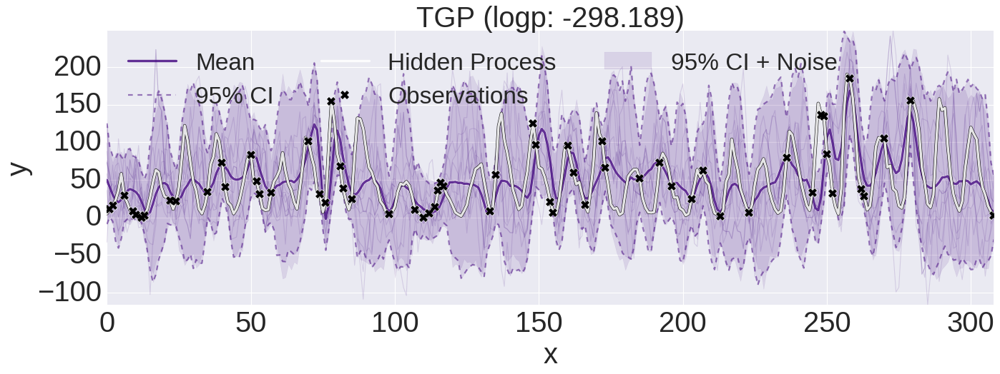

In [22]:
tp = tgp.find_MAP(points=1, init='powell')
tgp.plot(tp, quantiles_noise=True, median=False, mean=True, samples=10, prior=False, 
         palette='Purples', logp=True, simulations=300, noise=True)

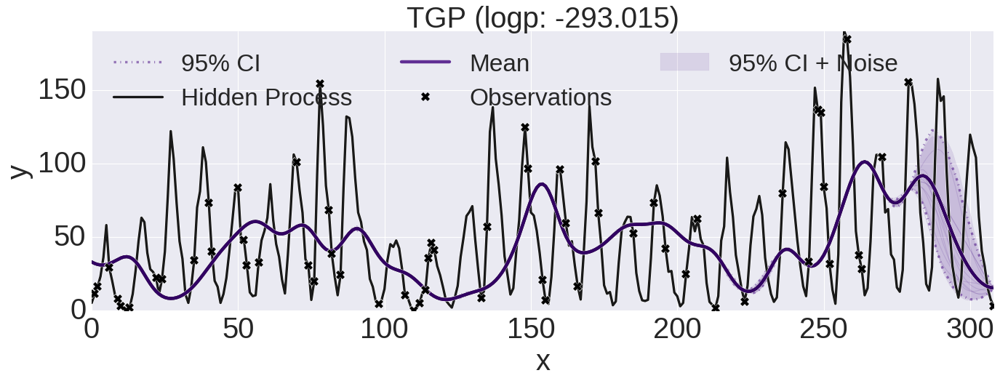

In [16]:
tgp.plot(tp, quantiles_noise=True, median=False, mean=True, samples=10, prior=False, 
         palette='Purples', logp=True, simulations=300, noise=False)

In [14]:
tgp.f_transport.posterior

<bound method Transport.posterior of TMapping @ TLocation @ TKernel>

In [11]:
return

SyntaxError: 'return' outside function (<ipython-input-11-64672a10de46>, line 1)

In [ ]:
transport = g3.TMapping(g3.BoxCoxLinear2()) @ g3.TLocation(g3.Bias(x)) @ g3.TKernel(g3.SE(x), noisy=False)
tgp = g3.TransportGaussianProcess(space=x, transport=transport, hidden=y)
tgp.observed(x_obs, y_obs)
tp = tgp.find_MAP(points=1)
tgp.plot(tp, quantiles_noise=True, median=False, mean=True, samples=10, prior=False, 
         palette='Purples', logp=True, simulations=300, noise=True)

In [ ]:
g3.plot(tgp.sampler(tp, samples=100, prior=False, noise=False))

In [ ]:
g3.plot(tgp.transport(tp, vector=np.random.randn(len(tgp.space)), prior=False, noise=True))

In [ ]:
tgp.plot(tp, quantiles_noise=True, median=False, mean=True, samples=10, prior=False, 
         palette='Purples', logp=True, simulations=300)

In [ ]:
params = wgp.sample_hypers(p, samples=10000)
g3.plot_datatrace(params)

In [ ]:
transport = g3.TMapping(g3.BoxCoxLinear2()) @ g3.TLocation(g3.Bias(x)) @ g3.TKernel(g3.SE(x) + g3.KernelNoise(x, name='Noise'))
tgp = g3.TransportGaussianProcess(space=x, transport=transport, hidden=y)
tgp.observed(x_obs, y_obs)
tp = tgp.find_MAP(points=1)
tp.TGP_Noise_var_log_ = -10
tgp.plot(tp, quantiles_noise=True, median=False, mean=False, samples=10, logp=True)

In [ ]:
transport = g3.TLocation(g3.Bias(x)) @ g3.TKernel(g3.SE(x) + g3.KernelNoise(x, name='Noise')) @ g3.TMapping(g3.SinhArcsinh())
tgp = g3.TransportGaussianProcess(space=x, transport=transport, hidden=y)
tgp.observed(x_obs, y_obs)
tp = tgp.find_MAP(points=2)
tp.TGP_Noise_var_log_ = -10
tgp.plot(tp, quantiles_noise=True, median=False, mean=True, samples=10, logp=True)

In [ ]:
tp = tgp.find_MAP(points=1)
tp.TGP_Noise_var_log_ = -10
tgp.plot(tp, quantiles=False, quantiles_noise=False, median=False, mean=True, samples=100, logp=True)

In [ ]:
tp = tgp.find_MAP(points=2)
tp.TGP_Noise_var_log_ = -10
tgp.plot(tp, quantiles_noise=True, median=False, mean=True, samples=100, logp=True)